In [1]:
import numpy as np 
import numpy.random as rnd
import matplotlib.pyplot as plt
from IPython.display import YouTubeVideo as ytv
plt.style.use('ggplot') 
from IPython.display import Audio, Image 
import scipy.signal as sig 
%matplotlib inline

<h1>Final Music Project | "Love Lockdown" by Kanye West</h1>

<h2>Jason Reynolds</h2>

<h3>HEADPHONES RECOMMENDED</h3>

<h2>Global Variables</h2>

First I mapped variables to the midi note numbers.

In [2]:
## Assigning midi note values to variable that describe the note and octave.
A0,AS0,B0,C1,CS1,D1,DS1,E1,F1,FS1,G1,GS1,A1,AS1,B1,C2,CS2,D2,DS2,E2,F2,FS2,G2,GS2,A2,BS2,B2,C3,CS3,D3,DS3,E3,F3,FS3,G3,GS3,A3,BS3,B3,C4,CS4,D4,DS4,E4,F4,FS4,G4,GS4,A4,BS4,B4,C5,CS5,D5,DS5,E5,F5,FS5,G5,GS5,A5,BS5,B5,C6,CS6,D6,DS6,E6,F6,FS6,G6,GS6,A6,BS6,B6,C7,CS7,D7,DS7,E7,F7,FS7,G7,GS7,A7,BS7,B7,C8=21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108

Now a couple of constants, Fs and the song length in samples.

In [3]:
##Length of song in samples (at Fs=22000 this is 4:30)
songLength = 5940000
Fs = 22000

<h2>Functions</h2>

<b>Here I have the following functions: </b>

delay(): blends in a delayed version of the input signal

string_env(): string based envelope

string_env2(): second string based envelope filter (modified to prevent most of the clipping and to better suit the main melody instrument)

drum_env(): drum hit based envelope filter. Very sharp attack and quick decay.

trap_env(): trapezoidal envelope filter

playSine(): converts arrays of notes and durations into the sinewave representation of them

playTriangle(): converts arrays of notes and durations into the triangle wave representation of them

playDrums(): converts arrays of drum names and durations into a sequence of drum samples.

In [4]:
def delay(drySig,shift=5000,wetMix=.5):
    """function for adding delay effect to signal
    Parameters:
    1) drySig: an array, containing samples of an audio signal
    2) shift: an int, number of samples that the delayed signal will be shifted
    3) wetMix: float, amplitude of wet part of signal
    
    This function adds delay to a signal using a y[n] = x[n]+ay[n-t] delay formula.
    (y[n] = output, x[n] = input, t = delay value, a = attenuation)
    """
    wetSig=np.zeros(len(drySig))
    idx = 0
    while idx<len(drySig):
        if idx<shift:
            wetSig[idx] = drySig[idx]
        else:
            wetSig[idx] = drySig[idx] +wetMix*wetSig[idx-shift]
        idx += 1
    return wetSig  

def string_env(t,dur=1): 
    """envelope function for vibrating string""" 
    env = (1-np.exp(-80*t))*np.exp(-8*t) 
    return env/np.max(env)

def string_env2(t,dur=1): 
    """envelope function for vibrating string""" 
    env = (1-np.exp(-100*t))*np.exp(-11*t) 
    return env/np.max(env)

def drum_env(t,dur=1): 
    """envelope function for a drum strike""" 
    env = (1-np.exp(-2000*t))*np.exp(-10*t) 
    return env/np.max(env)

def trap_env(t, dur=1, up = 0.1, down = 0.3): 
    """simple trapezoid shaped envelope function, starts at 0, rises to 1,stays there, then drops back to 0""" 
    condlist = [t<up, t<dur-down, True] 
    choicelist = [t/up, 1, (dur-t)/down] 
    return np.select(condlist, choicelist)

def playSine(song, env=trap_env, basenote=440, Fs=22000, time=1,amplitude=1): 
    """takes in an array containing note values and durations and returns an array containing the sinusoid 
    wave values that correspond
    """ 
    sounds = [] 
    for note in song: 
        fnum, dur = note 
        t = np.linspace(0,dur*time,int(dur*time*Fs),endpoint=False) 
        f = basenote * 2**((fnum-69)/12) 
        sinusoid = np.sin(2*np.pi*f*t)*amplitude 
        sounds.append(env(t,dur*time) * sinusoid) 
    return np.concatenate(sounds)

def playTriangle(song, env=trap_env, basenote=440, Fs=22000, time=1,amplitude=1): 
    """takes in an array containing note values and durations and returns an array containing the triangle wave 
    values that correspond
    """ 
    sounds = [] 
    for note in song: 
        fnum, dur = note 
        t = np.linspace(0,dur*time,int(dur*time*Fs),endpoint=False) 
        f = basenote * 2**((fnum-69)/12) 
        sinusoid = sig.sawtooth(2*np.pi*f*t,.5)*amplitude 
        sounds.append(env(t,dur*time) * sinusoid) 
    return np.concatenate(sounds)

#Creating drum sample for use by playDrums() function
####################################################################################################
#create 2 basic drum sound from noise
drumSampleLength=.07
t=np.linspace(0,drumSampleLength,drumSampleLength*Fs,endpoint=False)
snareBase = 3*rnd.randn(len(t))

#first drum

##remove highs with HP
b=sig.firwin(15,0.15)
snareLP=np.convolve(b,snareBase,'same')
##remove lows with LP
b=sig.firwin(35,0.003,pass_zero=False)
snareShort=np.convolve(b,snareLP,'same')*string_env2(t,drumSampleLength)

#second drum

##remove lows with HP
b=sig.firwin(15,0.0001)
snareLP=np.convolve(b,snareBase,'same')
##remove highs with LP
b=sig.firwin(35,0.02,pass_zero=False)
snareShort2=np.convolve(b,snareLP,'same')*string_env2(t,drumSampleLength)

#creating an additional sound to blend into the above two drums in order to add attack at the beginning

t=np.linspace(0,.02,.02*Fs,endpoint=False)
snareBase = 3*rnd.randn(len(t))
##remove highs with HP
b=sig.firwin(15,0.0001)
atk=np.convolve(b,snareBase,'same')*drum_env(t,.02)

#add zeroes to the end to match the length of the drum samples
atk = np.append(atk,np.zeros(1100))

#blending the attack and the drums
snareShort = .7*snareShort+atk
snareShort2 = .7*snareShort2+atk
####################################################################################################

def playDrums(song, env=trap_env, basenote=440, Fs=22000, time=1,amplitude=1): 
    """takes in an array containing 'high' or 'low' and durations and returns an array containing the values associated
    with two drums being played at those durations""" 
    sounds = []
    for note in song: 
        hit, dur = note
        rest = int(dur*Fs*time-1540)
        t = np.linspace(0,dur*time,int(dur*time*Fs),endpoint=False) 
        if hit=='high':
            drumStrike = np.append(snareShort,np.zeros(rest))
        elif hit =='low':
            drumStrike = np.append(snareShort2,np.zeros(rest))
        sounds.append(env(t,dur*time)*drumStrike) 
    return np.concatenate(sounds)

<h2>Drums</h2>

Here I specify L and H to reference the strings required by the playDrums() function and write the drum part.

In [5]:
L='low'
H='high'
drumline=[(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.5),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.5),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.5),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.5),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.5),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.5),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.5),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.25),(H,.25),(L,.5),(L,.5),(L,.5)]

Below I assembled the entire drum track for the song. The drums are a repeating part that doesn't change except for coming in and out of the arrangement. Therefore putting the track together mostly entailed appending alternating arrays of zeros and of the drum part. Lastly, I added a short delay to the track, then ran the new delayed version through the delay again, then ran that version through again. Each time I made adjustments to the wet/dry mix. This was done in order to add a bit of ambience and also to give the impression of the drums being played by a group of people instead of just a lone drummer.

In [6]:
silence=np.zeros(1199000)
drums=playDrums(drumline,env=drum_env,time=.5)

drumComp=np.append(silence,drums)
drumComp=np.append(drumComp,np.zeros(1072500))
drumComp=np.append(drumComp,drums)
drumComp=np.append(drumComp,np.zeros(1072500))
for n in range(4):
    drumComp=np.append(drumComp,drums)
numZeros = songLength-len(drumComp)

drumComp=np.append(drumComp,np.zeros(numZeros))
#Delaying the signa
drumComp=delay(drumComp,shift=1375,wetMix=.35)
drumComp=delay(drumComp,shift=1375,wetMix=.2)
drumComp=delay(drumComp,shift=1375,wetMix=.1)
#Audio(drumComp,rate=Fs)

<h2>Bassline</h2>

Next I created the bassline which runs throughout the entire song. I'm fairly certain that Kanye's original bass sound is not too far off from a sinewave so I also didn't stray from that. I just created the bassline for the song and then blended in an octave above and an octave below (both attenuated) to add some clarity to distiguish the notes and to fill out the low end respectively.

In [7]:
##Creating low bassline (176000 samples long) this plays throughout the entire song
bassline=[(CS2,.5),(CS2,.5),(E2,1),(E1,2)]
bass=[]

for n in range(135):
    bass=bass+bassline
bassline=bass

bassline3=[(CS1,.5),(CS1,.5),(E1,1),(E1,2)]
bass=[]

for n in range(135):
    bass=bass+bassline3
bassline3=bass


In [8]:
##Octave up from bassline
bassline2=[(CS3,.5),(CS3,.5),(E3,1),(E2,2)]
bass=[]

for n in range(135):
    bass=bass+bassline2
bassline2=bass

##Blending the two with the higher pitched one quiter, just adding it for clarity on speakers without low end.

#bassCombo=list(x+y for x,y in zip(playSine(bassline,env=string_env,Fs=Fs,time=.5),playSine(bassline2,env=string_env,Fs=Fs,time=.5,amplitude=.3)))

bassline = playSine(bassline,env=string_env,Fs=Fs,time=.5)
bassline2 = playSine(bassline2,env=string_env,Fs=Fs,time=.5,amplitude=.3)
bassline3 = playSine(bassline3,env=string_env,Fs=Fs,time=.5,amplitude=.5)
bassCombo = bassline+bassline2+bassline3


<h2>Piano</h2>

For the piano part, I built each chord by creating an array for what each finger would be playing during the riff. So first is the riff over C# minor, then F# minor 7 then B. After creating each of these segments of the total part I then combined them and constructed the songlength track by doing as I did before with the drums, alternating between arrays of zeros and the arrays containing the samples of the piano part. I felt that the piano track was a little boomy so I used a low pass to trim some of the bottom off to let it sit better in the mix. Lastly, I also added a small bit of delay to the track for ambience.

<h3>C# Minor Chord</h3>

In [9]:
#C sharp minor                                                  
leftP = [(CS3,.5),(CS3,.5),(CS3,.5),(CS3,.5),(CS3,.5),(CS3,1.5)]
leftM = [(E3,.5),(E3,.5),(E3,.5),(E3,.5),(E3,.5),(E3,1.5)]
leftThumb = [(GS3,.5),(GS3,.5),(GS3,.5),(GS3,.5),(GS3,.5),(GS3,1.5)]

rightThumb = [(E4,.5),(E4,.5),(GS4,.5),(GS4,.5),(E4,.5),(E4,1.5)]
rightM = [(GS4,.5),(GS4,.5),(CS4,.5),(CS4,.5),(GS4,.5),(GS4,1.5)]
rightP = [(CS4,.5),(CS4,.5),(E5,.5),(E5,.5),(CS4,.5),(CS4,1.5)]

#doubling the sequence
for n in range(2):
    leftP=leftP+leftP
    leftM=leftM+leftM
    leftThumb=leftThumb+leftThumb
    rightP=rightP+rightP
    rightM=rightM+rightM
    rightThumb=rightThumb+rightThumb


In [10]:
# generating the waves
rightThumb = playSine(rightThumb,env=string_env,Fs=Fs,time=.5)
rightM = playSine(rightM,env=string_env,Fs=Fs,time=.5)
rightP = playSine(rightP,env=string_env,Fs=Fs,time=.5)
leftThumb = playSine(leftThumb,env=string_env,Fs=Fs,time=.5)
leftM = playSine(leftM,env=string_env,Fs=Fs,time=.5)
leftP = playSine(leftP,env=string_env,Fs=Fs,time=.5)

#combine the seperate finger tracks into one piano part
idx=0
pianoCompCSharp=np.zeros(len(rightThumb))
while idx < len(pianoCompCSharp):
    pianoCompCSharp[idx]=rightThumb[idx]+rightM[idx]+rightP[idx]+leftP[idx]+leftM[idx]+leftThumb[idx]
    idx+=1

    
#Audio(pianoCompCSharp,rate=Fs)

<h3>F# Minor 7 Chord</h3>

In [11]:
#F sharp minor 7                                                  
leftP = [(FS3,.5),(FS3,.5),(FS3,.5),(FS3,.5),(FS3,.5),(FS3,1.5)]
leftM = [(A3,.5),(A3,.5),(A3,.5),(A3,.5),(A3,.5),(A3,1.5)]
leftThumb = [(CS3,.5),(CS3,.5),(CS3,.5),(CS3,.5),(CS3,.5),(CS3,1.5)]

rightThumb = [(A4,.5),(A4,.5),(CS4,.5),(CS4,.5),(A4,.5),(A4,1.5)]
rightM = [(CS4,.5),(CS4,.5),(FS4,.5),(FS4,.5),(CS4,.5),(CS4,1.5)]
rightP = [(FS4,.5),(FS4,.5),(A5,.5),(A5,.5),(FS4,.5),(FS4,1.5)]


leftP=leftP+leftP+leftP
leftM=leftM+leftM+leftM
leftThumb=leftThumb+leftThumb+leftThumb
rightP=rightP+rightP+rightP
rightM=rightM+rightM+rightM
rightThumb=rightThumb+rightThumb+rightThumb


In [12]:
#generating the waves
rightThumb = playSine(rightThumb,env=string_env,Fs=Fs,time=.5)
rightM = playSine(rightM,env=string_env,Fs=Fs,time=.5)
rightP = playSine(rightP,env=string_env,Fs=Fs,time=.5)
leftThumb = playSine(leftThumb,env=string_env,Fs=Fs,time=.5)
leftM = playSine(leftM,env=string_env,Fs=Fs,time=.5)
leftP = playSine(leftP,env=string_env,Fs=Fs,time=.5)

#combining seperate finger tracks into one piano part
idx=0
pianoCompFSharp=np.zeros(len(rightThumb))
while idx < len(pianoCompFSharp):
    pianoCompFSharp[idx]=rightThumb[idx]+rightM[idx]+rightP[idx]+leftP[idx]+leftM[idx]+leftThumb[idx]
    idx+=1
#Audio(pianoCompFSharp,rate=Fs)

<h3>B Chord</h3>

In [13]:
#B 
leftP = [(B3,.5),(B3,.5),(B3,1.5),(CS3,1.5)]
leftM = [(DS3,.5),(DS3,.5),(DS3,1.5),(E3,1.5)]
leftThumb = [(FS3,.5),(FS3,.5),(FS3,1.5),(GS3,1.5)]

rightThumb = [(FS4,.5),(FS4,.5),(FS4,.5),(FS4,.5),(FS4,.5),(E4,1.5)]
rightM = [(B4,.5),(B4,.5),(B4,.5),(B4,.5),(B4,.5),(GS4,1.5)]
rightP = [(FS4,.5),(FS4,.5),(E5,.5),(E5,.5),(FS4,.5),(CS4,1.5)]


In [14]:
rightThumb = playSine(rightThumb,env=string_env,Fs=Fs,time=.5)
rightM = playSine(rightM,env=string_env,Fs=Fs,time=.5)
rightP = playSine(rightP,env=string_env,Fs=Fs,time=.5)
leftThumb = playSine(leftThumb,env=string_env,Fs=Fs,time=.5)
leftM = playSine(leftM,env=string_env,Fs=Fs,time=.5)
leftP = playSine(leftP,env=string_env,Fs=Fs,time=.5)

idx=0
pianoCompB=np.zeros(len(rightThumb))
while idx < len(pianoCompB):
    pianoCompB[idx]=rightThumb[idx]+rightM[idx]+rightP[idx]+leftP[idx]+leftM[idx]+leftThumb[idx]
    idx+=1
#Audio(pianoCompB,rate=Fs)

<h3>Assemble the Combined Track</h3>

In [15]:
#create empty array to hold combined piano part
chorusPiano =[]

#Combine the chords into a complete part
chorusPiano = np.append(chorusPiano,pianoCompCSharp)
chorusPiano = np.append(chorusPiano,pianoCompFSharp)
chorusPiano = np.append(chorusPiano,pianoCompB)

#using a temp array while adding in the spaces in the song for when the piano does and doesn't play
temp=[]
for n in range(4):
    temp=np.append(temp,chorusPiano)
    
temp=np.append(temp,np.zeros(176000*2))
temp=np.append(temp,chorusPiano)
temp=np.append(temp,np.zeros(176000*2))

for n in range(7):
    temp=np.append(temp,chorusPiano)

#creating initial offset to starting position
space=np.zeros(852500)

#using second temp array for placing the space at the beginning
temp2=[]
temp2 = np.append(space,temp)

#paino will be the final array
piano=[]
piano=np.append(piano,temp2)

#adding zeros at the end to keep all the complete instrument tracks the same length
numZeros = songLength-len(piano)
piano = np.append(piano,np.zeros(numZeros))

#remove a little low end
b=sig.firwin(15,0.01)
piano=np.convolve(b,piano,'same')

#add some delay... 
piano = delay(piano,wetMix=.3)

#Audio(piano,rate=Fs)

<h2>Vocals</h2>

Here I worked out the main melody line, which was a lilttle tricky in this song because it doesn't repeat exactly. First I wrote out the seperate parts then I combined them in the sequence to build the song length track filling in zeros as neccesary to start and end correctly. Then I used a combination of sinewaves and triangle waves to create the base sound of the instrument. Then I applied low and high pass filters ( I know, I could have used a band pass, don't judge). Next I applied a clip to the array to flatten the tops and bottoms of the waves which would introduce some harmonics and give it a more overdriven sound. Lastly, I added some delay to mimic the delay used by Kanye on his vocals in the original song. 

<b>NOTE:</b> The lyrics are not accurate after the first verse.

<h3>First Verse</h3>

In [16]:
##                      I'm       not    lov-    -ing     you  |    way      I     wan-   -ted       to  |    what      I       had    to       do |     had       to      run      from     you 
verseVoxOne=[(B2,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(B2,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(B2,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(GS3,.5),(FS3,2)]                                            
#             I'm      in       love       with    you |  but      the      vibe      is      wro-   -ng  | and      that    haun-    -ted      me   |   all      the     way    home
verseVoxTwo=[(GS3,.5),(FS3,.5),(FS3,.5),(E3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(DS3,1),(CS3,1),(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(GS3,.5),(FS3,.5),(FS3,1),(CS3,2)]
#                 So    you'll   nev-     -er      kno-      -o-     -0-      -w      | nev-     -ver     ev-       -er    know / nev-     -ver      know    e-       -no-    -ugh      | till     it's    o-        -ver    love
verseVoxThree=[(B3,.5),(B3,.5),(CS4,.5),(CS4,.5),(CS4,.75),(B3,.25),(A3,.25),(GS3,.75),(CS4,.5),(CS4,.5),(E4,.5),(CS4,.5),(CS4,2),(CS4,.5),(CS4,.5),(E4,.5),(CS4,.5),(GS4,.5),(FS4,1.5),(FS4,.5),(E4,.5),(FS4,.75),(E4,.25),(CS4,2)]
##             Till       we      lose    con-     -tro-     -ol |     sys-   -tem     -ov-      -er      load | screm-  -ing      no     no      no     no        no-    -oooo|
verseVoxFour =[(CS4,.5),(CS4,.5),(E4,.5),(CS4,.5),(GS4,.5),(FS4,1.5),(FS4,.5),(E4,.5),(FS4,.75),(E4,.25),(CS4,2),(B3,.5),(CS4,.5),(E4,1),(DS4,1),(B3,1),(GS3,.5),(E4,.5),(CS4,2)]
#              I'm        in      love    with    you   |  way       I       want-   -ted     to   |  see      I      want    to       mo-      -oove |    can't    es-     cape    from     you
verseVoxFive=[(GS3,.5),(FS3,.5),(FS3,.5),(E3,.5),(CS3,2),(GS3,.5),(FS3,.5),(FS3,.5),(E3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(E3,.5),(GS3,.5),(FS3,1.5),(GS3,.5),(FS3,.5),(FS3,.5),(E3,.5),(CS3,2)]
#               So      I      keep      it      low   | keep      our     sec-    -ret     co-      -old    |  so      ev-     -ery     bo        dy      else |  don't   have     to       kno-   -ow
verseVoxSix=[(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(GS3,.5),(FS3,1.5),(FS3,.5),(GS3,1),(GS3,.5),(FS3,.5),(FS3,.5),(E3,1),(E3,.5),(DS3,.5),(E3,.5),(DS3,.5),(CS3,1.5)]

verseOneCombined= verseVoxOne+verseVoxTwo+verseVoxThree+verseVoxFour+verseVoxFive+verseVoxSix

<h3>Second Verse</h3>

In [17]:
##SECOND VERSE VOCALS

##              I'm       not    lov-    -ing    you  |    way      I       wan-   -ted       to  |    what      I       had    to       do |     had       to      run      from     you 
verse2VoxOne=[(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(GS3,.5),(FS3,2),(FS3,.5),(E3,.5),(CS3,.5),(E3,.5),(CS3,2)]                                            
#             I'm      in       love       with    you           |  but      the      vibe      is      wro-   -ng  | and      that    haun-    -ted      me     |   all      the     way    home
verse2VoxTwo=[(A3,.5),(A3,.5),(A3,.5),(A3,.5),(GS3,.5),(FS3,1.5),(FS3,.5),(E3,.5),(FS3,.5),(E3,.5),(GS3,.5),(FS3,1.5),(CS3,.5),(CS3,.5),(E3,1),(GS3,.5),(FS3,1.5),(FS3,.5),(E3,.5),(FS3,.5),(E3,.5),(CS3,2)]
#                 So    you'll   nev-     -er      kno-    | nev-     -ver     ev-       -er    know   | nev-     -ver      know    e-       -no-    -ugh    | till     it's    o-        -ver    love
verse2VoxThree=[(CS4,.5),(CS4,.5),(E4,.5),(CS4,.5),(CS4,2), (CS4,.5),(CS4,.5),(E4,.5),(CS4,.5),(CS4,2),(CS4,.5),(CS4,.5),(E4,.5),(CS4,.5),(GS4,.5),(FS4,1.5),(FS4,.5),(E4,.5),(FS4,.75),(E4,.25),(CS4,2)]
##             Till       we      lose    con-     -tro-     -ol |     sys-   -tem     -ov-      -er      load | screm-  -ing      no     no      no     no        no-    -oooo|
verse2VoxFour =[(A3,.5),(CS4,.5),(DS4,.5),(E4,1),(DS4,.5),(CS4,.5),(A3,1),(A3,.5),(A3,.5),(A3,.5),(CS4,.5),(DS4,.5),(DS4,.5),(CS4,1.5),(DS4,.5),(CS4,3),(DS4,.5),(CS4,3)]
#              I'm        in      love    with    you   |  way       I       want-   -ted     to   |  see      I      want    to       mo-      -oove |    can't    es-     cape    from     you
verse2VoxFive=[(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(GS3,.5),(FS3,2),(FS3,.5),(E3,.5),(CS3,.5),(E3,.5),(CS3,2)]                                            
#               So      I      keep      it      low   | keep      our     sec-    -ret     co-      -old    |  so      ev-     -ery     bo        dy      else |  don't   have     to       kno-   -ow
verse2VoxSix=[(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(GS3,.5),(FS3,2),(FS3,.5),(E3,.5),(E3,1),(GS3,.5),(FS3,1.5),(E3,.5),(E3,.5),(E3,.5),(CS3,.5),(CS3,2)]

#Combining the seperate lines
verseTwoCombined= verse2VoxOne+verse2VoxTwo+verse2VoxThree+verse2VoxFour+verse2VoxFive+verse2VoxSix

<h3>Third Verse</h3>

In [18]:
##              I'm       not    lov-    -ing    you  |    way      I       wan-   -ted       to  |    what      I       had    to       do |     had       to      run      from     you 
verse3VoxOne=[(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(GS3,.5),(FS3,2),(FS3,.5),(E3,.5),(CS3,.5),(E3,.5),(CS3,2)]                                            
#             I'm      in       love       with    you           |  but      the      vibe      is      wro-   -ng  | and      that    haun-    -ted      me     |   all      the     way    home
verse3VoxTwo=[(A3,.5),(A3,.5),(A3,.5),(A3,.5),(GS3,.5),(FS3,1.5),(FS3,.5),(E3,.5),(FS3,.5),(E3,.5),(GS3,.5),(FS3,1.5),(CS3,.5),(CS3,.5),(E3,1),(GS3,.5),(FS3,1.5),(FS3,.5),(E3,.5),(FS3,.5),(E3,.5),(CS3,2)]
#                 So    you'll   nev-     -er      kno-    | nev-     -ver     ev-       -er    know   | nev-     -ver      know    e-       -no-    -ugh    | till     it's    o-        -ver    love
verse3VoxThree=[(CS4,.5),(CS4,.5),(E4,.5),(CS4,.5),(CS4,2), (CS4,.5),(CS4,.5),(E4,.5),(CS4,.5),(CS4,2),(CS4,.5),(CS4,.5),(E4,.5),(CS4,.5),(GS4,.5),(FS4,1.5),(FS4,.5),(E4,.5),(FS4,.75),(E4,.25),(CS4,2)]
##             Till       we      lose    con-     -tro-     -ol |     sys-   -tem     -ov-      -er      load | screm-  -ing      no     no      no     no        no-    -oooo|
verse3VoxFour =[(A3,.5),(CS4,.5),(DS4,.5),(E4,1),(DS4,.5),(CS4,.5),(A3,1),(A3,.5),(A3,.5),(A3,.5),(CS4,.5),(DS4,.5),(DS4,.5),(CS4,1.5),(DS4,.5),(CS4,3),(DS4,.5),(CS4,3)]
#              I'm        in      love    with    you   |  way       I       want-   -ted     to   |  see      I      want    to       mo-      -oove |    can't    es-     cape    from     you
verse3VoxFive=[(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(GS3,.5),(FS3,2),(FS3,.5),(E3,.5),(CS3,.5),(E3,.5),(CS3,2)]                                            
#               So      I      keep      it      low   | keep      our     sec-    -ret     co-      -old    |  so      ev-     -ery     bo        dy      else |  don't   have     to       kno-   -ow
verse3VoxSix=[(CS3,.5),(CS3,.5),(E3,.5),(CS3,.5),(CS3,2),(CS3,.5),(CS3,.5),(E3,.5),(GS3,.5),(FS3,2),(FS3,.5),(E3,.5),(E3,1),(GS3,.5),(FS3,1.5),(E3,.5),(E3,.5),(E3,.5),(CS3,.5),(CS3,2)]

#Combinging the seperate lines
verseThreeCombined= verse3VoxOne+verse3VoxTwo+verse3VoxThree+verse3VoxFour+verse3VoxFive+verse3VoxSix

<h3>Chorus Vocals</h3>

In [19]:
#                  so     keep      your     love  locked     down  |   your   love    locked     down   |    keep     your   love   locked   down  |    your     love     locked    down |   
chorusVoxOne = [(GS3,.5),(GS3,.5),(GS3,.5),(E4,1),(DS4,1),(GS3,1.5),(GS3,.5),(E4,.75),(DS4,.75),(GS3,1.5),(GS3,.5),(GS3,.5),(E4,1),(DS4,1),(GS3,1.5),(GS3,.5),(E4,.75),(DS4,.75),(GS3,1)]
#                                                                   |                                     |                                          |  
chorusVoxTwo = [(CS4,.5),(CS4,.5),(CS4,.5),(GS4,1),(FS4,1),(FS4,1.5),(CS4,.5),(GS4,.75),(FS4,.75),(FS4,1.5),(CS4,.5),(CS4,.5),(GS4,1),(FS4,1),(FS4,1),(DS4,.5),(CS4,3.5)]

#Combining the seperate lines
chorusCombined = chorusVoxOne+chorusVoxTwo

<h3>Combining the Vocals</h3>

In [20]:
##Combining the vocal parts
vox=verseOneCombined+chorusCombined+verseTwoCombined+chorusCombined+verseThreeCombined+chorusCombined

#Creating a blend of triangle and sine waves
voxTriangle = playTriangle(vox,env=string_env2,Fs=Fs,time=.5)
voxSine = playSine(vox,env=string_env2,Fs=Fs,time=.5)
voxMix=voxTriangle+voxSine

#offsetting the vocals to their prope starting point
voxMix=np.append(np.zeros(159500),voxMix)

#adding zeros to the end (to make sure all the instrument tracks are the same length)
numZeros = songLength-len(voxMix)
voxMix = np.append(voxMix,np.zeros(numZeros))

#high pass filter
b=sig.firwin(15,0.2,pass_zero=False)
voxMix=np.convolve(b,voxMix,'same')

#low pass filter
b=sig.firwin(15,0.8,)
voxMix=np.convolve(b,voxMix,'same')

#adding a clip to flat the tops and bottoms of the curves and thereby introduce some harmonics and add a "overdriven" sound
voxMix = np.clip(voxMix,-.8,.8)

voxMix=delay(voxMix,shift = 4125,wetMix =.4)

<h2>Putting it All Together</h2>

Here I'm just adding the tracks together into a final compsite array

In [21]:
#Create empty array to hold the composite song
composite=np.zeros(len(bassCombo))
#add the parts together
composite = composite + .9*bassCombo + .4*drumComp + 7*voxMix +.3*piano

#listen to some Yeezy
Audio(composite,rate=Fs)

<h2>Song Information</h2>

Title: Love Lockdown
Artist: Kanye West
Album: 808's and Heartbreak
Link: https://youtu.be/HZwMX6T5Jhk

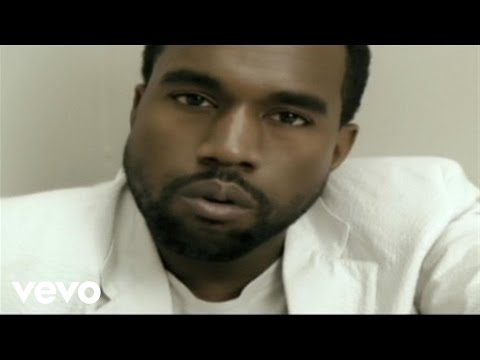

In [22]:
ytv('HZwMX6T5Jhk')